This main notebook will be used to create features out of the cleaned housing data, as well as add features from external sources such as inflation data, interest rates, unemployment rates, crime rates, and nearby features for each house.

In [2]:
# Import 3rd party libraries",
import os
import pandas as pd
import matplotlib.pylab as plt
import geopandas as gpd

from datetime import datetime

import folium
from folium import Circle

import seaborn as sns
import numpy as np

# Configure Notebook
import warnings
warnings.filterwarnings('ignore')
%config Completer.use_jedi = False

Lets read our house_data_final csv which we previously cleaned to contain only around 50 features.

In [3]:
# Creating housing DataFrame
house_data = pd.read_csv('houses_data_final.csv')
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50575 entries, 0 to 50574
Data columns (total 53 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0.1            50575 non-null  int64  
 1   Unnamed: 0              50575 non-null  int64  
 2   address                 50575 non-null  object 
 3   isResidentialProperty   50575 non-null  object 
 4   propertyLat             50575 non-null  float64
 5   propertyLng             50575 non-null  float64
 6   searchNeighborhood      50575 non-null  object 
 7   List Date               50575 non-null  object 
 8   Sold Price              38378 non-null  float64
 9   Original Price          18633 non-null  float64
 10  Type                    50574 non-null  object 
 11  Style                   50484 non-null  object 
 12  Size (sq ft)            15027 non-null  object 
 13  Age                     12753 non-null  object 
 14  Community               50575 non-null

A big part of this project relies on the sold price.  For houses with no sold price, a good approximation is the listing price.

In [4]:
def get_price(row):
    """The following funtion takes in a row and returns the 'Sold Price' if it exists, otherwise it returns
    the listing price."""
    if row['Sold Price'] == None:
        return row['List Price']
    else:
        return row['Sold Price']

In [5]:
# Create Price column, where it is the sold price, or list price if there is no sold price
house_data['Price'] = house_data.apply(get_price, axis = 1)

# drop the original Sold Price and List Price Columns
house_data.drop(columns = ['Sold Price','List Price'], inplace = True)
house_data = house_data.dropna(subset = 'Price') # drop houses with no prices
house_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38378 entries, 0 to 50574
Data columns (total 52 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Unnamed: 0.1            38378 non-null  int64  
 1   Unnamed: 0              38378 non-null  int64  
 2   address                 38378 non-null  object 
 3   isResidentialProperty   38378 non-null  object 
 4   propertyLat             38378 non-null  float64
 5   propertyLng             38378 non-null  float64
 6   searchNeighborhood      38378 non-null  object 
 7   List Date               38378 non-null  object 
 8   Original Price          14272 non-null  float64
 9   Type                    38378 non-null  object 
 10  Style                   38345 non-null  object 
 11  Size (sq ft)            11456 non-null  object 
 12  Age                     9848 non-null   object 
 13  Community               38378 non-null  object 
 14  Bedrooms                38339 non-null  flo

We now have just under 140,000 houses in our Dataframe, a lot less than the close to 500,000 rows we started with, but these are houses that all have a price and are residential.  Now we can start looking closer into these houses.  Lets start by seeing where they are using a GeoDataFrame and when they were listed.  While sold date may be a more important metric for some houses, it doesn't exist for all the houses, and the listed date gives a good approximation of when this house was on the market, and the geographical and finacial state at that time.

In [6]:
# Create a geodataframe from the houses dataframe with longitude and latidue as geometry
house_data_gpd = gpd.GeoDataFrame(house_data, geometry = 
                                          gpd.points_from_xy(house_data['propertyLng'], house_data['propertyLat']))
house_data_gpd.crs = {'init': 'epsg:4326'}

In [7]:
# Convert list date to DateTime
house_data_gpd['Date'] = pd.to_datetime(house_data['List Date'])
house_data_gpd.drop(columns = ['List Date'], inplace = True)

In [8]:
# lets look at the distribution of what years these houses were listed in
house_data_gpd.groupby(house_data_gpd['Date'].dt.year).count()['address']

Date
2013    3634
2014    4110
2015    4462
2016    1774
2017     390
2018      93
2019    3356
2020    5134
2021    6365
2022    4846
2023    4214
Name: address, dtype: int64

Lets look at where all these houses are (uncomment this cell to see, otherwise it slows than the notebook a lot)

In [9]:
# # Create a map of Toronto
# map_1 = folium.Map(location=[43.6426, -79.3871], 
#                    tiles='cartodbpositron', 
#                    zoom_start=10)

# for idx, row in house_data_gpd.to_crs(epsg=4326).iterrows():
#     Circle(location=[row.geometry.y, row.geometry.x],
#            radius=20,
#            color='forestgreen').add_to(map_1)

# # Display map
# map_1

Now it's time to build a DataFrame which can be used for analysis and modeling creating only the most useful features.

In [10]:
# Create new dataframe for model building with each houses basic information
house_features = house_data_gpd[['address', 'Date', 'geometry', 'Price', 'propertyLng', 'propertyLat']].copy()
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324


First, lets create a feature for each type of house.  It can be detached, semi-detached, a condo, or other.

In [11]:
# Group type into 5 groups: Detached, semidetached, condo, and other
house_data_gpd['Type'] = house_data_gpd['Type'].apply(lambda x: 'Detached' if x == 'Detached' else
                                                      'Detached' if x == 'D.' else
                                                      'Detached' if x == 'Rural Resid' else
                                                      'Detached' if x == 'R.' else
                                                      'Detached' if x == 'R.' else
                                                      'Semi-Detached' if x == 'Semi-Detached' else
                                                      'Semi-Detached' if x == 'S.' else
                                                      'Semi-Detached' if x == 'A.' else
                                                      'Semi-Detached' if x == 'Att/Row/Twnhouse' else
                                                      'Semi-Detached' if 'plex' in str(x) else
                                                      'Condo' if x == 'Condo' else
                                                      'Condo' if x == 'T.' else
                                                      'Condo' if x == 'Condo Townhouse' else
                                                      'Condo' if x == 'C.' else
                                                      'Condo' if x == 'Condo Apt' else
                                                      'Condo' if x == 'Det Condo' else
                                                      'Condo' if x == 'Co-Op Apt' else
                                                      'Condo' if x == 'Comm Element Condo' else
                                                      'Condo' if x == 'Semi-Det Condo' else
                                                      'Condo' if x == 'Store W/Apt/Office' else 'other'
                                                     )

house_data_gpd['Type'].value_counts()

Type
Detached         26581
Semi-Detached    10773
other              613
Condo              411
Name: count, dtype: int64

In [12]:
# Create Type Feature using get_dummies, and drop one column (condos) for one hot encoding
house_features['Type'] = house_data_gpd['Type']
house_features = pd.get_dummies(house_features, columns = ['Type'], prefix = 'T', drop_first = True)
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,True,False,False
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,True,False,False
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,True,False,False
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,False,True,False
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324,True,False,False


Lets look at the utilites of each house and convert that into a utilities feature

In [13]:
# Turn heating into 1s and 0s
house_data_gpd['Heating'] = house_data_gpd['Heating'].fillna(0)
house_data_gpd['Heating'] = house_data_gpd['Heating'].apply(lambda x: 0 if x == 0 else 1)

# Turn air conditioning into 1s and 0s
house_data_gpd['Air Conditioning'] = house_data_gpd['Air Conditioning'].fillna(0)
house_data_gpd['Air Conditioning'] = house_data_gpd['Air Conditioning'].apply(lambda x: 0 if x == 'None' else
                                                                              0 if x == 0 else 
                                                                              1 if x == 'Central Air' else 0.5)

# Turn sewers into 1s and 0s 
house_data_gpd['Sewer'] = house_data_gpd['Sewer'].fillna(0)
house_data_gpd['Sewer'] = house_data_gpd['Sewer'].apply(lambda x: 1 if x == 'Sewers' else
                             0 if x == 0 else
                             0 if x == None else 0.5)

# Create Utilities Feature
house_features['Utilities'] = house_data_gpd.loc[:,['Heating','Air Conditioning','Sewer']].sum(axis=1)
house_features['Utilities'].value_counts()

Utilities
3.0    31234
2.0     4189
2.5     2827
1.0       59
1.5       58
0.0        9
0.5        2
Name: count, dtype: int64

Now lets add some features for the amount of types of total and certain rooms in each house.  We assume for the rooms that 'Rooms Plus' is already accounted for in 'Rooms', so by adding an extra 0.5 for each 'Rooms Plus' we are really weighting a 'Rooms Plus' at 1.5 a normal roow.  Same applies for the bedrooms, kitchen, and 'Washrooms Type 3 # Pcs'.

In [14]:
# add room data
house_data_gpd['Rooms'] = house_data_gpd['Rooms'].fillna(0)
house_data_gpd['Rooms Plus'] = house_data_gpd['Rooms Plus'].fillna(0) * 0.5
house_features['Rooms'] = house_data_gpd.loc[:,['Rooms','Rooms Plus']].sum(axis=1)

# add bathroom data
house_data_gpd['Bathrooms'] = house_data_gpd['Bathrooms'].fillna(0)
house_data_gpd['Washrooms Type 3 # Pcs'] = house_data_gpd['Washrooms Type 3 # Pcs'].fillna(0) * 0.5
house_features['Bathrooms'] = house_data_gpd.loc[:,['Bathrooms','Washrooms Type 3 # Pcs']].sum(axis=1)

# add kitchen data
house_data_gpd['Kitchens'] = house_data_gpd['Kitchens'].fillna(0)
house_data_gpd['Kitchens Plus'] = house_data_gpd['Kitchens Plus'].fillna(0) * 0.5
house_features['Kitchens'] = house_data_gpd.loc[:,['Kitchens','Kitchens Plus']].sum(axis=1)

# add bedroom data
house_data_gpd['Bedrooms'] = house_data_gpd['Bedrooms'].fillna(0)
house_data_gpd['Bedrooms Plus'] = house_data_gpd['Bedrooms Plus'].fillna(0) * 0.5
house_features['Bedrooms'] = house_data_gpd.loc[:,['Bedrooms','Bedrooms Plus']].sum(axis=1)

# add basement data
house_features['Basement'] = house_data_gpd['Basement'].fillna(0).apply(lambda x: 1 if x == 'Finished' else
                                           1 if x == 1 else
                                           0 if x == 0 else
                                           0 if x == 'None' else 0.5)

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,Rooms,Bathrooms,Kitchens,Bedrooms,Basement
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,True,False,False,3.0,9.0,4.0,1.0,4.0,0.5
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,True,False,False,3.0,8.0,6.0,1.5,3.5,1.0
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,True,False,False,3.0,8.0,5.5,1.0,3.0,0.5
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,False,True,False,3.0,6.5,2.0,1.0,3.0,1.0
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324,True,False,False,3.0,11.0,6.0,1.0,4.0,0.5


Lets add a feature for the parking at each house

In [15]:
# Create Parking Feature
house_data_gpd['Driveway'] = house_data_gpd['Driveway'].fillna(0).apply(lambda x: 1 if x == 'Private' else
                                                                                0 if x == 'None' else
                                                                                0 if x == 0 else
                                                                                2 if x == 'Pvt Double' else 0.5)

house_data_gpd['Garage'] = house_data_gpd['Garage'].fillna(0).apply(lambda x: 1 if x == 'Attached' else
                                                                                 1 if x == 'Detached' else
                                                                                 1 if x == 'Built-In' else
                                                                                 0 if x == 0 else 0.5)

house_features['Parking'] = house_data_gpd.loc[:,['Driveway','Garage']].sum(axis=1)
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,Rooms,Bathrooms,Kitchens,Bedrooms,Basement,Parking
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,True,False,False,3.0,9.0,4.0,1.0,4.0,0.5,3.0
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,True,False,False,3.0,8.0,6.0,1.5,3.5,1.0,2.0
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,True,False,False,3.0,8.0,5.5,1.0,3.0,0.5,3.0
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,False,True,False,3.0,6.5,2.0,1.0,3.0,1.0,0.5
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324,True,False,False,3.0,11.0,6.0,1.0,4.0,0.5,3.0


Also lets add some features for whether or not there is a Fireplace, pool, access to the waterfront, where it is furnished or not, and also whether or not there are some additional features.  These additional features were too varied to considere seperatly, so if the house had at least one thing listed in their features column, they get a 1, otherwise they get a 0.

In [16]:
# Fireplace Feature
house_features['Fireplace'] = house_data_gpd['Fireplace'].fillna(0).apply(lambda x: 1 if x == 'Y' else 0)

# Feature Feature
house_features['Feature'] = house_data_gpd['Feature'].fillna(0).apply(lambda x: 0 if x == 0 else 1)

# Pool Feature
house_features['Pool'] = house_data_gpd['Feature'].fillna(0).apply(lambda x: 0 if x == 0 else 
                                                                   0 if x == 'None' else 1)
# Waterfront Feature
house_features['Waterfront'] = house_data_gpd['Waterfront'].fillna(0).apply(lambda x: 0 if x == 0 else 
                                                                            0 if x == 'None' else 
                                                                            1 if x == 'Direct' else 0.5)
# Furnished Feature
house_features['Furnished'] = house_data_gpd['Furnished'].fillna(0).apply(lambda x: 0 if x == 0 else 
                                                                          0 if x == 'N' else 
                                                                          1 if x == 'Y' else 0.5)

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Bathrooms,Kitchens,Bedrooms,Basement,Parking,Fireplace,Feature,Pool,Waterfront,Furnished
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,True,False,False,3.0,...,4.0,1.0,4.0,0.5,3.0,1,1,1,0.0,0.0
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,True,False,False,3.0,...,6.0,1.5,3.5,1.0,2.0,0,1,1,0.0,0.0
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,True,False,False,3.0,...,5.5,1.0,3.0,0.5,3.0,0,1,1,0.0,0.0
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,False,True,False,3.0,...,2.0,1.0,3.0,1.0,0.5,0,1,1,0.0,0.0
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324,True,False,False,3.0,...,6.0,1.0,4.0,0.5,3.0,1,0,0,0.0,0.0


Unfortunatly, the size of each house in square ft was unreliable and not available for every house, so we will make an estimation based off the frontage and lot depth of each house.  We will fill houses with no data with a frontage and Lot Depth of 25 as that was the average and median of these columns.

In [17]:
# size data
house_data_gpd['Frontage'] = house_data_gpd['Frontage'].fillna(25)
house_data_gpd['Lot Depth'] = house_data_gpd['Lot Depth'].fillna(25)
house_features['Size'] = house_data_gpd.loc[:,['Frontage','Lot Depth']].sum(axis=1)

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Kitchens,Bedrooms,Basement,Parking,Fireplace,Feature,Pool,Waterfront,Furnished,Size
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,True,False,False,3.0,...,1.0,4.0,0.5,3.0,1,1,1,0.0,0.0,170.00
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,True,False,False,3.0,...,1.5,3.5,1.0,2.0,0,1,1,0.0,0.0,158.95
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,True,False,False,3.0,...,1.0,3.0,0.5,3.0,0,1,1,0.0,0.0,182.00
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,False,True,False,3.0,...,1.0,3.0,1.0,0.5,0,1,1,0.0,0.0,111.74
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324,True,False,False,3.0,...,1.0,4.0,0.5,3.0,1,0,0,0.0,0.0,171.21


As a final feature for the housing data, we will lool at which way the house was facing

In [18]:
# Fronting On Feature
house_features['Front_E'] = house_data_gpd['Fronting On'].fillna(0).apply(lambda x: 1 if x == 'E' else
                                                                       1 if x == 'Ew' else
                                                                       1 if x == 'Se' else
                                                                       1 if x == 'Ne' else 0)

house_features['Front_S'] = house_data_gpd['Fronting On'].fillna(0).apply(lambda x: 1 if x == 'S' else
                                                                       1 if x == 'Sw' else
                                                                       1 if x == 'Se' else
                                                                       1 if x == 'Ns' else 0)

house_features['Front_W'] = house_data_gpd['Fronting On'].fillna(0).apply(lambda x: 1 if x == 'W' else
                                                                       1 if x == 'Sw' else
                                                                       1 if x == 'Ew' else
                                                                       1 if x == 'Nw' else 0)

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Parking,Fireplace,Feature,Pool,Waterfront,Furnished,Size,Front_E,Front_S,Front_W
0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,True,False,False,3.0,...,3.0,1,1,1,0.0,0.0,170.00,0,0,1
1,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,True,False,False,3.0,...,2.0,0,1,1,0.0,0.0,158.95,1,0,0
2,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,True,False,False,3.0,...,3.0,0,1,1,0.0,0.0,182.00,0,1,0
4,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,False,True,False,3.0,...,0.5,0,1,1,0.0,0.0,111.74,0,1,0
5,279-brooke-avenue,2013-10-12,POINT (-79.42220 43.73240),1500000.0,-79.4222,43.7324,True,False,False,3.0,...,3.0,1,0,0,0.0,0.0,171.21,0,1,0


Lets create another checkpoint of these housing features.

In [19]:
house_features.to_csv('final_house_data.csv')

Now lets start to build our features using external factors.  First, we will look at financial factors such and inflation and interest.  We can see that on average, other than a few dips, the average price of houses is increasing.  We want our final model to work without considering the year, so we need to find an explanation for this increase in average prices.

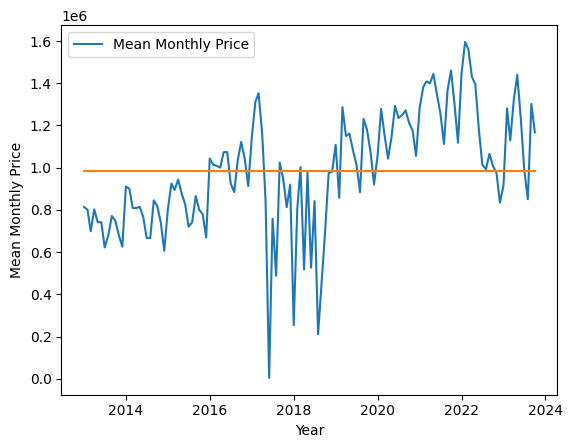

In [20]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = mean_year_price['Price'], label = 'Mean Monthly Price')

sns.lineplot(x = mean_year_price['Date'], y = mean_year_price['Price'].mean())

plt.legend()

plt.xlabel('Year') #x-axis name
plt.ylabel('Mean Monthly Price') #y-axis name
plt.show()

In [21]:
# read the inflation data and assign to a variable
inflation = pd.read_csv('INDINF_CPI (1).csv')

# convert the quarters into a corresponding date
inflation['Date'] = inflation['date'].apply(lambda x: x[0:4] + '-01-01' if x.endswith('Q1') else
                       x[0:4] + '-04-01' if x.endswith('Q2') else
                       x[0:4] + '-07-01' if x.endswith('Q3') else
                       x[0:4] + '-10-01' if x.endswith('Q4') else x)

inflation['Date'] = pd.to_datetime(inflation['Date']) # convert those dates into a datetime

# add the column 'INDINF_CPI_Q' containing the inflation rate to a rate variable
inflation['Rate'] = inflation['INDINF_CPI_Q']

# drop the other columns
inflation.drop(columns = ['INDINF_CPI_TRIM_Q','INDINF_CPI_MEDIAN_Q', 'INDINF_CPI_COMMON_Q', 'date'], inplace = True)

inflation = inflation[inflation['Date'].dt.year >= 2002] # trim out the inflation data less than 2002

# Create a running cumlative sum of the inflation data, essentially creating an inflation rate for each quarter
# with respect to 2002.
inflation['Rate'] = (1 + inflation['Rate'].expanding().mean() / 100) ** (
    inflation['Date'].apply(lambda x: (x - pd.to_datetime('2001-01-01')) / np.timedelta64(1, 'Y')))

inflation.head()

,INDINF_CPI_Q,Date,Rate
36,1.6,2002-01-01,1.016000
37,1.3,2002-04-01,1.018108
38,2.3,2002-07-01,1.026040
39,3.8,2002-10-01,1.039659
40,4.5,2003-01-01,1.054729


So that we can effectively compare data, lets create a function to normalize it from 0-1.

In [22]:
def NormalizeData(data):
    """This function takes in a column of data, and normalizes the values from 0-1."""
    return (data - np.min(data)) / (np.max(data) - np.min(data))

Lets plot the monthly normalized mean price (green) vs the normalized inflation rate and the normalized cumlative inflation rate.  We can see some trends that align, but still a lot of unexplained variation.

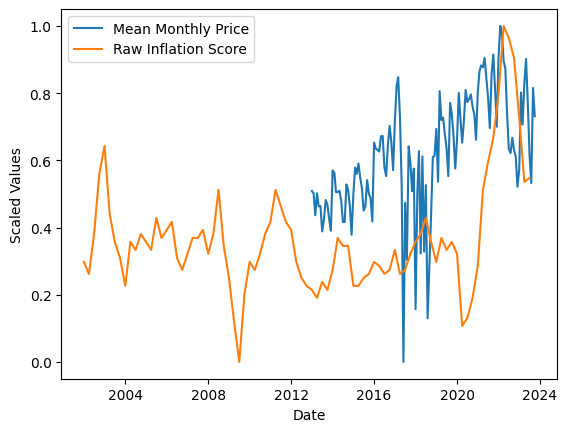

In [23]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = NormalizeData(mean_year_price['Price']), label = 'Mean Monthly Price')

sns.lineplot(inflation, x = 'Date', y = NormalizeData(inflation['INDINF_CPI_Q']), label = 'Raw Inflation Score')

plt.legend()

plt.xlabel('Date') #x-axis name
plt.ylabel('Scaled Values') #y-axis name
plt.show()

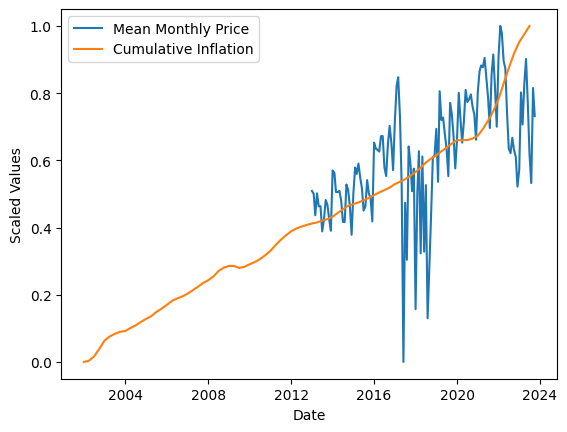

In [24]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = NormalizeData(mean_year_price['Price']), label = 'Mean Monthly Price')

sns.lineplot(inflation, x = 'Date', y = NormalizeData(inflation['Rate']), label = 'Cumulative Inflation')

plt.legend()

plt.xlabel('Date') #x-axis name
plt.ylabel('Scaled Values') #y-axis name
plt.show()

Perhaps we can shift the effect of the inflation data to try and make the peaks and troughs of the raw data line up better with our mean monthly price

In [25]:
# read the inflation data and assign to a variable
inflation_shift = pd.read_csv('INDINF_CPI (1).csv')

# convert the quarters into a corresponding date
inflation_shift['Date'] = inflation_shift['date'].apply(lambda x: x[0:4] + '-01-01' if x.endswith('Q1') else
                       x[0:4] + '-04-01' if x.endswith('Q2') else
                       x[0:4] + '-07-01' if x.endswith('Q3') else
                       x[0:4] + '-10-01' if x.endswith('Q4') else x)

# convert those dates into a datetime
inflation_shift['Date'] = pd.to_datetime(inflation_shift['Date'])

# add the column 'INDINF_CPI_Q' containing the inflation rate to a Shift_rate variable
inflation_shift['Shift_Rate'] = inflation_shift['INDINF_CPI_Q']

# add the column 'INDINF_CPI_Q' containing the inflation rate to a Shift_INDINF_CPI_Q variable
inflation_shift['Shift_INDINF_CPI_Q'] = inflation_shift['INDINF_CPI_Q']

# drop the other columns
inflation_shift.drop(columns = ['INDINF_CPI_TRIM_Q','INDINF_CPI_MEDIAN_Q', 'INDINF_CPI_COMMON_Q', 'INDINF_CPI_Q',
                                'date'], inplace = True)

inflation_shift = inflation_shift[inflation_shift['Date'].dt.year >= 2002]  # trim out inflation data before 2002

# Create a running cumlative sum of the inflation data, essentially creating an inflation rate for each quarter
# with respect to 2002.
inflation_shift['Shift_Rate'] = (1 + inflation_shift['Shift_Rate'].expanding().mean() / 100) ** (
    inflation_shift['Date'].apply(lambda x: (x - pd.to_datetime('2001-01-01')) / np.timedelta64(1, 'Y')))

inflation_shift['Date'] = inflation_shift['Date'] + pd.DateOffset(days=90) # offset the date by 90 days

inflation_shift.head()

,Date,Shift_Rate,Shift_INDINF_CPI_Q
36,2002-04-01,1.016000,1.6
37,2002-06-30,1.018108,1.3
38,2002-09-29,1.026040,2.3
39,2002-12-30,1.039659,3.8
40,2003-04-01,1.054729,4.5


Lets plot the inflation vs house price data again

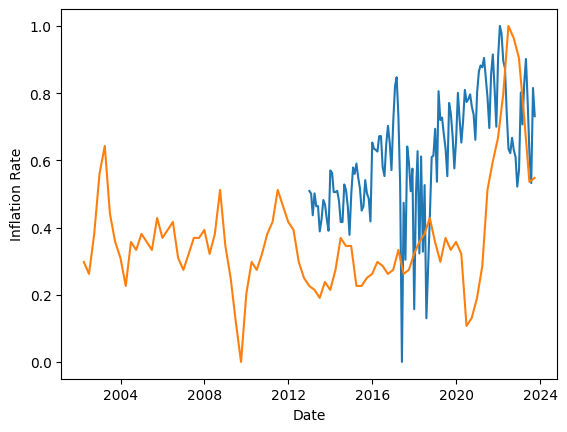

In [26]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = NormalizeData(mean_year_price['Price']))

sns.lineplot(inflation_shift, x = 'Date', y = NormalizeData(inflation_shift['Shift_INDINF_CPI_Q']))

plt.xlabel('Date') #x-axis name
plt.ylabel('Inflation Rate') #y-axis name
plt.show()

We can see shifting the inflation data actually made it line up worse.  There must be something else at play.  Lets look at the interest rates.

In [27]:
interest_rate = pd.read_csv('interest rates.csv') # read the interest rates csv
interest_rate.head()

,Date,V39079,Delta,V39078,Canadian Overnight Repo Rate Average (CORRA) (%),V39068,V39071,V39072,V39073,V39074
0,2023-10-18,5,0.0,5.25,5.04,,,,,
1,2023-10-17,5,0.0,5.25,5.03,,,,,
2,2023-10-16,5,0.0,5.25,5.01,,,,,
3,2023-10-13,5,0.0,5.25,5.03,,,,,
4,2023-10-12,5,0.0,5.25,5.03,,,,,


In [28]:
interest_rate=interest_rate.iloc[:,0:3] # we only need the first three columns
interest_rate = interest_rate.rename(columns={'V39079':'Interest %'}) # Rename V39079 to Interest % for clarity

In [29]:
interest_rate['Date'] = pd.to_datetime(interest_rate['Date']) # convert the Date column to a Datetime
interest_rate.head()

,Date,Interest %,Delta
0,2023-10-18,5,0.0
1,2023-10-17,5,0.0
2,2023-10-16,5,0.0
3,2023-10-13,5,0.0
4,2023-10-12,5,0.0


In [30]:
# removing any items that are not interest rates

def replace_bank_holiday(row):
    if 'Bank holiday' in str(row['Interest %']):
        # Find the index of the current row
        index = row.name
        # Try to convert the previous and next values to float
        try:
            prev_value = float(interest_rate.at[index - 1, 'Interest %'])
        except (ValueError, KeyError):
            prev_value = None
        try:
            next_value = float(interest_rate.at[index + 1, 'Interest %'])
        except (ValueError, KeyError):
            next_value = None

        # Replace 'Bank holiday' with the mean of adjacent numbers
        if prev_value is not None and next_value is not None:
            row['Interest %'] = str((prev_value + next_value) / 2)
            return row
        elif prev_value is not None:
            row['Interest %'] = str(prev_value)
            return row
        elif next_value is not None:
            row['Interest %'] = str(next_value)
            return row
        else:
            # Handle the case when there are no adjacent numeric values
            row['Interest %'] = '0'
            return row
    else:
        return row

In [31]:
# Apply the function to replace 'Bank holiday'
interest_rate = interest_rate.apply(replace_bank_holiday, axis=1)
interest_rate['Interest %'] = interest_rate['Interest %'].astype(float)
interest_rate.head()

,Date,Interest %,Delta
0,2023-10-18,5.0,0.0
1,2023-10-17,5.0,0.0
2,2023-10-16,5.0,0.0
3,2023-10-13,5.0,0.0
4,2023-10-12,5.0,0.0


Lets merge the inflation data and interest data onto our house_features Dataframe on the closest date in the past, since we cannot know future data for a house.

In [32]:
# merge inflation data
house_features = pd.merge_asof(house_features.sort_values(by = 'Date'), inflation, on="Date", direction='backward')

# merge interest data
house_features = pd.merge_asof(house_features.sort_values(by = 'Date'), interest_rate.sort_values(by = 'Date'),
                               on="Date", direction='backward')
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Waterfront,Furnished,Size,Front_E,Front_S,Front_W,INDINF_CPI_Q,Rate,Interest %,Delta
0,970-caledonia-road,2013-01-01,POINT (-79.46570 43.70800),400000.0,-79.4657,43.7080,True,False,False,3.0,...,0.0,0.0,179.27,0,0,1,0.9,1.26679,NaN,NaN
1,100-westhumber-boulevard,2013-01-02,POINT (-79.58390 43.72640),391000.0,-79.5839,43.7264,True,False,False,3.0,...,0.0,0.0,160.00,0,1,0,0.9,1.26679,NaN,NaN
2,484-mcroberts-avenue,2013-01-02,POINT (-79.45880 43.68760),745000.0,-79.4588,43.6876,False,True,False,3.0,...,0.0,0.0,160.22,0,0,1,0.9,1.26679,NaN,NaN
3,10-green-ash-terrace,2013-01-03,POINT (0.00000 0.00000),500000.0,0.0000,0.0000,True,False,False,3.0,...,0.0,0.0,168.38,0,0,0,0.9,1.26679,NaN,NaN
4,145-regina-avenue,2013-01-03,POINT (-79.44300 43.72540),1400000.0,-79.4430,43.7254,True,False,False,3.0,...,0.0,0.0,187.00,0,1,0,0.9,1.26679,NaN,NaN


Lets plot the price data (blue), the interest data (orange) and in delta (green).  Delta is the change in interest rate over 30 days, essentially the approximation of the slope.

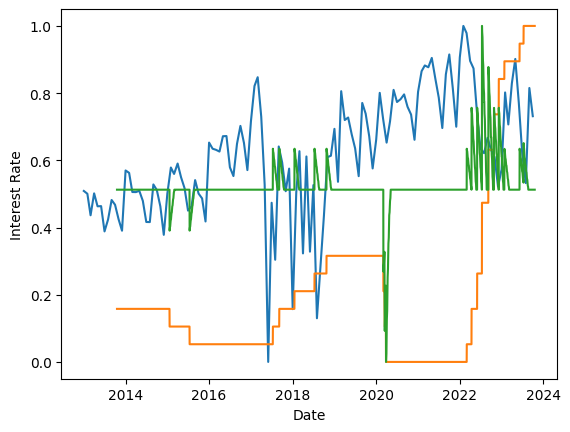

In [33]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")


sns.lineplot(x = mean_year_price['Date'], y = NormalizeData(mean_year_price['Price']))

sns.lineplot(interest_rate, x = interest_rate['Date'], y = NormalizeData(interest_rate['Interest %']))

sns.lineplot(interest_rate, x = interest_rate['Date']
             ,y = NormalizeData(interest_rate['Delta']))

plt.xlabel('Date') #x-axis name
plt.ylabel('Interest Rate') #y-axis name
plt.show()

Let's clean up the graph now

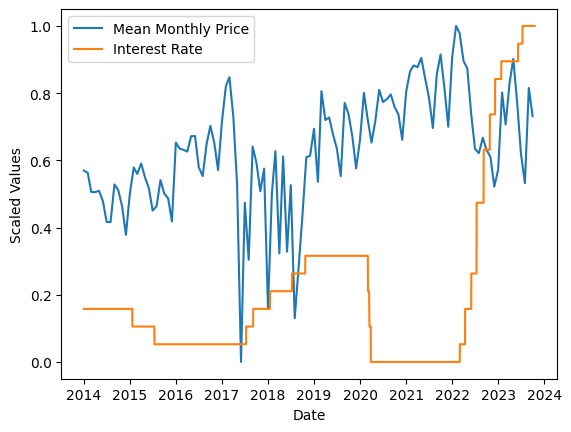

In [34]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

# norm_price = mean_year_price
# norm_price['Price'] = 


sns.lineplot(x = mean_year_price[(mean_year_price['Date'].dt.year > 2013)]['Date'],
             y = NormalizeData(mean_year_price['Price']), label = 'Mean Monthly Price')

sns.lineplot(interest_rate, x = interest_rate[(interest_rate['Date'].dt.year > 2013)]['Date'],
             y = NormalizeData(interest_rate['Interest %']), label = 'Interest Rate')

plt.legend()


plt.xlabel('Date') #x-axis name
plt.ylabel('Scaled Values') #y-axis name
plt.show()

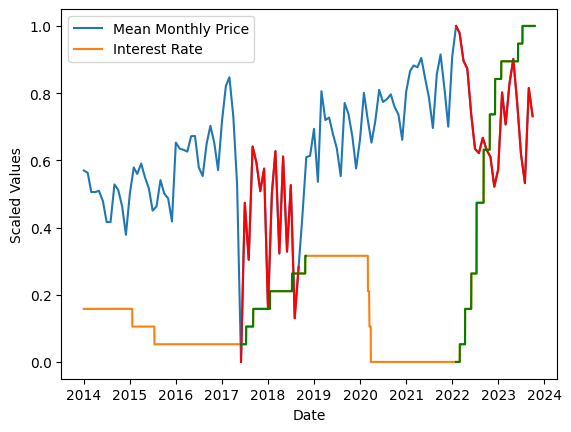

In [35]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

# norm_price = mean_year_price
# norm_price['Price'] = 


sns.lineplot(x = mean_year_price[(mean_year_price['Date'].dt.year > 2013)]['Date'],
             y = NormalizeData(mean_year_price['Price']), label = 'Mean Monthly Price')

sns.lineplot(interest_rate, x = interest_rate[(interest_rate['Date'].dt.year > 2013)]['Date'],
             y = NormalizeData(interest_rate['Interest %']), label = 'Interest Rate')

sns.lineplot(x = mean_year_price[(mean_year_price['Date'] > datetime(2017, 5, 30)) &
                                (mean_year_price['Date'] < datetime(2018, 9, 30))]['Date'],
             y = NormalizeData(mean_year_price['Price']), color = 'Red')

sns.lineplot(interest_rate, x = interest_rate[(interest_rate['Date'] > datetime(2017, 5, 30)) &
                                (interest_rate['Date'] < datetime(2018, 10, 30))]['Date'],
             y = NormalizeData(interest_rate['Interest %']), color = 'Green')

sns.lineplot(x = mean_year_price[(mean_year_price['Date'] > datetime(2022, 1, 30)) &
                                (mean_year_price['Date'] < datetime(2023, 12, 30))]['Date'],
             y = NormalizeData(mean_year_price['Price']), color = 'Red')

sns.lineplot(interest_rate, x = interest_rate[(interest_rate['Date'] > datetime(2022, 1, 30)) &
                                (interest_rate['Date'] < datetime(2023, 12, 30))]['Date'],
             y = NormalizeData(interest_rate['Interest %']), color = 'Green')

plt.xlabel('Date') #x-axis name
plt.ylabel('Scaled Values') #y-axis name
plt.show()

We can see that as the interest data rises we get our drops in housing prices, and the bigger the rise in interest prices, the bigger the drop in housing prices.

Now lets look at the population data of Toronto to see how competetive the market is.

In [36]:
file_path= 'Toronto-population-2023-11-20.csv'


with open(file_path, 'r') as file:
    lines = file.readlines()

# Displaying a sample of lines from different parts of the file to determine where the population data starts
sample_lines = {
    'Start of File': lines[:5],
    'Middle of File': lines[len(lines)//2:len(lines)//2 + 5],
    'End of File': lines[-5:]
}

In [37]:
relevant_lines = [line for line in lines if '2003' in line or '2004' in line or '2005' in line or
                  '2006' in line or '2007' in line or '2008' in line or '2009' in line or
                  '2010' in line or '2011' in line or '2012' in line or '2013' in line or
                  '2014' in line or '2015' in line or '2016' in line or '2017' in line or
                  '2018' in line or '2019' in line or '2020' in line or '2021' in line or
                  '2022' in line or '2023' in line]

# Converting the extracted lines into a DataFrame
population_data = pd.DataFrame([sub.split(",") for sub in relevant_lines], 
                               columns=["Year", "Population", "Growth Rate"])

# Converting 'Year' to datetime and 'Population' to numeric for plotting
population_data['Year'] = pd.to_datetime(population_data['Year'])
population_data['Population'] = pd.to_numeric(population_data['Population'])

# Displaying the cleaned DataFrame to verify the data
population_data.head()

,Year,Population,Growth Rate
0,2003-12-31,4861000,1.76\n
1,2004-12-31,4948000,1.79\n
2,2005-12-31,5035000,1.76\n
3,2006-12-31,5125000,1.79\n
4,2007-12-31,5216000,1.78\n


In [38]:
# add population data to the each house based off the year it was listed
house_features['Population'] = pd.merge_asof(house_features,population_data, left_on = 'Date',
                         right_on = 'Year', direction='nearest')['Population']

How does the Population vs Price plot look?

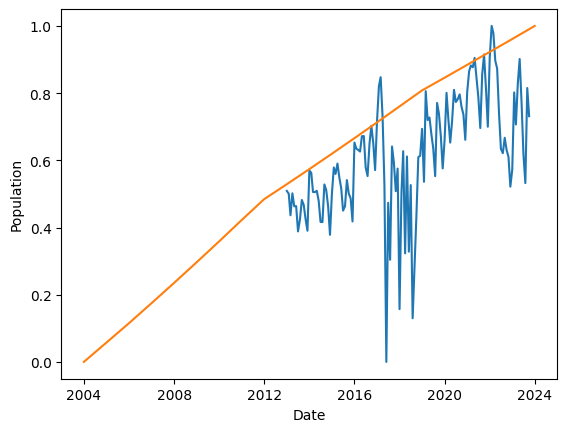

In [39]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = NormalizeData(mean_year_price['Price']))

sns.lineplot(population_data, x = 'Year', y = NormalizeData(population_data['Population']))

plt.xlabel('Date') #x-axis name
plt.ylabel('Population') #y-axis name
plt.show()

How well does inflation and population explain the housing price increasing trend?

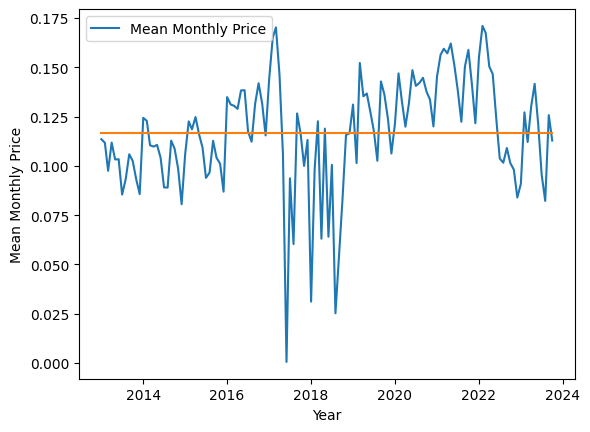

In [40]:
temp_price = house_features[['Date', 'Rate', 'Price', 'Population']]
temp_price['Norm'] = temp_price['Price'] / temp_price['Rate'] / temp_price['Population']

mean_year_price = temp_price.groupby(temp_price['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Norm'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = mean_year_price['Norm'], label = 'Mean Monthly Price')

sns.lineplot(x = mean_year_price['Date'], y = mean_year_price['Norm'].mean())

plt.legend()
plt.xlabel('Year') #x-axis name
plt.ylabel('Mean Monthly Price') #y-axis name
plt.show()

Now lets look at the unemployement data

In [41]:
unemp = pd.read_csv('unemployment rate.csv') #read the unmployement data
unemp['Date'] = pd.to_datetime(unemp['Date']) # convert the data to datetime

# merge the unemployment rate of the relevant year in Ontario to each house
house_features['Unemployment'] = pd.merge_asof(house_features,
                                               unemp.sort_values('Date'), 'Date')['Unemployment rate %, Ontario']

house_features.tail()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Size,Front_E,Front_S,Front_W,INDINF_CPI_Q,Rate,Interest %,Delta,Population,Unemployment
38373,26-woodycrest-avenue,2023-10-26,POINT (-79.34260 43.68080),1640000.0,-79.3426,43.6808,True,False,False,3.0,...,166.50,0,0,1,3.7,1.624638,5.0,0.0,6372000,5.5
38374,7-mitchell-avenue,2023-10-26,POINT (-79.40640 43.64510),1540000.0,-79.4064,43.6451,False,True,False,3.0,...,88.71,0,1,0,3.7,1.624638,5.0,0.0,6372000,5.5
38375,61-storer-drive,2023-10-26,POINT (-79.54790 43.74420),1160000.0,-79.5479,43.7442,True,False,False,3.0,...,216.63,0,1,0,3.7,1.624638,5.0,0.0,6372000,5.5
38376,52-exmoor-drive,2023-10-30,POINT (-79.54450 43.59210),5500.0,-79.5445,43.5921,True,False,False,3.0,...,50.00,0,0,0,3.7,1.624638,5.0,0.0,6372000,5.5
38377,52-exmoor-drive,2023-10-30,POINT (-79.54450 43.59210),5500.0,-79.5445,43.5921,True,False,False,3.0,...,50.00,0,0,0,3.7,1.624638,5.0,0.0,6372000,5.5


And Let's plot the unemployment data vs the price

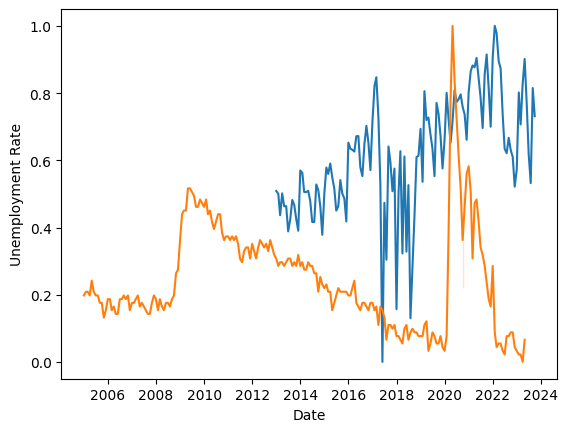

In [42]:
mean_year_price = house_features.groupby(house_features['Date'].apply(
    lambda x: str(x.year)+'/01/'+str(x.month)))['Price'].mean()
mean_year_price = mean_year_price.reset_index()
mean_year_price['Date'] = pd.to_datetime(mean_year_price['Date'], format = "%Y/%d/%m")

sns.lineplot(x = mean_year_price['Date'], y = NormalizeData(mean_year_price['Price']))

sns.lineplot(unemp, x = 'Date', y = NormalizeData(unemp['Unemployment rate %, Ontario']))

plt.xlabel('Date') #x-axis name
plt.ylabel('Unemployment Rate') #y-axis name
plt.show()

Now lets look into the the the impact of crime data on housing prices.

In [43]:
# import crime data
crime_data = pd.read_csv('Major_Crime_Indicators_Open_Data.csv')
crime_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360187 entries, 0 to 360186
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   REPORT_YEAR  360187 non-null  int64  
 1   LONG_WGS84   360187 non-null  float64
 2   LAT_WGS84    360187 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 8.2 MB


As we've seen, the housing prices go back to 2002.  However, the interest rates only go back as far as 2013, and the crime data goes to 2014.  To help our model's performance, lets only consider houses listed in 2014 or onwards from now on.

In [44]:
house_features = house_features.dropna(subset = 'Date') # drop blank dates
house_features = house_features[house_features['Date'].dt.year >= 2014] # filter out houses listed before 2014

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Size,Front_E,Front_S,Front_W,INDINF_CPI_Q,Rate,Interest %,Delta,Population,Unemployment
3634,38-bellefontaine-street,2014-01-01,POINT (-79.29100 43.79880),1250000.0,-79.2910,43.7988,True,False,False,3.0,...,200.00,0,0,1,1.4,1.279079,1.0,0.0,5728000,7.5
3635,888-royal-york-road,2014-01-02,POINT (-79.51060 43.64460),2950.0,-79.5106,43.6446,True,False,False,3.0,...,157.80,0,0,1,1.4,1.279079,1.0,0.0,5728000,7.5
3636,119-birkdale-road,2014-01-03,POINT (-79.26220 43.76050),1600.0,-79.2622,43.7605,False,True,False,3.0,...,50.00,1,0,0,1.4,1.279079,1.0,0.0,5728000,7.5
3637,22-cascaden-street,2014-01-03,POINT (-79.29040 43.82590),2300.0,-79.2904,43.8259,True,False,False,3.0,...,50.00,0,0,0,1.4,1.279079,1.0,0.0,5728000,7.5
3638,728-conacher-drive,2014-01-03,POINT (-79.40090 43.80110),1357500.0,-79.4009,43.8011,True,False,False,3.0,...,179.48,0,0,1,1.4,1.279079,1.0,0.0,5728000,7.5


Lets convert our crime data into a GeoDataFrame so we can do a spatial analysis with our houses

In [45]:
crime_gpf = gpd.GeoDataFrame(crime_data, geometry = 
                                          gpd.points_from_xy(crime_data['LONG_WGS84'], 
                                                             crime_data['LAT_WGS84']))
crime_gpf.crs = {'init': 'epsg:4326'}

Out of curiosity, where do the most major crimes happen in Toronto?  Let's plot it with a heat map

In [46]:
from folium.plugins import HeatMap

In [47]:
# Create a map of Toronto
map_5 = folium.Map(location=[43.6426, -79.3871], 
                   tiles='cartodbpositron', 
                   zoom_start=10)

# Add points to the map
HeatMap(data=list(zip(crime_gpf.to_crs(epsg=4326).geometry.y,
                      crime_gpf.to_crs(epsg=4326).geometry.x)),
        radius=20).add_to(map_5)

# Display map
map_5

The heatmap is as useful as it is worrying.  Lets try looking more closesly at each neighborhood.

In [48]:
# Open and read the toronto_neighbourhoods.shp file
neighbourhoods = gpd.read_file('toronto_neighbourhoods.shp')

In [49]:
# Remove neighbourhood id from 'FIELD_8' column, and rename as 'name'
neighbourhoods['name'] = neighbourhoods['FIELD_8'].apply(lambda x: " ".join((x.split(' '))[0:-1]))

# Remove all columns other than 'geometry' and 'name'
neighbourhoods.drop(neighbourhoods.columns[0:15], axis = 1, inplace = True)

neighbourhoods = neighbourhoods.to_crs(epsg=26917)

# Area of each neighbourhood
neighbourhoods['area'] = neighbourhoods['geometry'].area/10**6 # Divide by 10^6 to convert from m^2 to km^2

In [51]:
# Open and read the 2018_neighbourhood_pop.csv file
n_pop = pd.read_csv('neighbourhood_pop.csv')
neighbourhoods = neighbourhoods.merge(n_pop, how = "left", on = 'name') # merge with the neighbourhoods data
neighbourhoods = gpd.GeoDataFrame(neighbourhoods, geometry='geometry', crs="EPSG:26917")

In [52]:
# Count the number amount of crime in each neighbourhood per year
crime_gpf = crime_gpf.to_crs(epsg=26917)

# this for loop counts the crime in each neighborhood for each year and creates a column for it
for year in range(2014, 2024):
    neighbourhoods['crime_' + str(year)] = neighbourhoods.apply(lambda row: sum(
        crime_gpf[crime_gpf['REPORT_YEAR'] == year].within(row[0])), axis = 1)
neighbourhoods.head()

,geometry,name,area,Count,crime_2014,crime_2015,crime_2016,crime_2017,crime_2018,crime_2019,crime_2020,crime_2021,crime_2022,crime_2023
0,"POLYGON ((626071.503 4837537.756, 626151.708 4...",Wychwood,1.682042,14804,114,136,143,139,154,154,183,114,170,148
1,"POLYGON ((628032.302 4840233.689, 628139.346 4...",Yonge-Eglinton,1.650421,14349,77,68,62,64,74,89,82,83,132,105
2,"POLYGON ((629674.232 4837709.743, 629657.497 4...",Yonge-St.Clair,1.161288,11817,56,48,55,44,46,61,61,97,98,84
3,"POLYGON ((620320.085 4846288.688, 620352.534 4...",York University Heights,13.246739,12528,509,593,605,577,562,620,615,609,667,635
4,"POLYGON ((625714.291 4840359.316, 625680.263 4...",Yorkdale-Glen Park,6.038310,27593,265,276,330,325,366,423,372,352,501,467


Now let's combine the neighbourhood crime data for each house based off what neighbourhood it is in

In [53]:
house_features = house_features.to_crs(epsg=26917)

house_features = house_features.sjoin(neighbourhoods, how = "left")
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,crime_2014,crime_2015,crime_2016,crime_2017,crime_2018,crime_2019,crime_2020,crime_2021,crime_2022,crime_2023
3634,38-bellefontaine-street,2014-01-01,POINT (637480.621 4850945.725),1250000.0,-79.2910,43.7988,True,False,False,3.0,...,266.0,304.0,292.0,324.0,304.0,398.0,295.0,261.0,314.0,305.0
3635,888-royal-york-road,2014-01-02,POINT (620122.464 4833478.277),2950.0,-79.5106,43.6446,True,False,False,3.0,...,256.0,202.0,186.0,269.0,239.0,252.0,240.0,246.0,338.0,373.0
3636,119-birkdale-road,2014-01-03,POINT (639886.764 4846740.155),1600.0,-79.2622,43.7605,False,True,False,3.0,...,435.0,426.0,445.0,480.0,463.0,444.0,321.0,383.0,433.0,479.0
3637,22-cascaden-street,2014-01-03,POINT (637466.695 4853956.618),2300.0,-79.2904,43.8259,True,False,False,3.0,...,219.0,236.0,215.0,260.0,262.0,292.0,188.0,212.0,220.0,294.0
3638,728-conacher-drive,2014-01-03,POINT (628634.669 4851024.477),1357500.0,-79.4009,43.8011,True,False,False,3.0,...,203.0,183.0,224.0,238.0,228.0,247.0,240.0,301.0,412.0,305.0


In [54]:
# match crime year to house year
house_features['crime_density'] = 0

# this for loop filters out all the crime density years for each house and other than the year the house was listed
# and adds it to a crime_density variable
for Year in range(2014, 2024):
    house_features['crime_temp'] = house_features['crime_density'] # create temporary variable
    
    # if the listed year matches the house year, take that crime density, otherwise take the temporary one
    house_features['crime_density'] = house_features.apply(
        lambda row: row['crime_' + str(Year)] / row['area'] if row['Date'].year == Year 
        else row['crime_temp'], axis = 1)

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,crime_2016,crime_2017,crime_2018,crime_2019,crime_2020,crime_2021,crime_2022,crime_2023,crime_density,crime_temp
3634,38-bellefontaine-street,2014-01-01,POINT (637480.621 4850945.725),1250000.0,-79.2910,43.7988,True,False,False,3.0,...,292.0,324.0,304.0,398.0,295.0,261.0,314.0,305.0,37.177877,37.177877
3635,888-royal-york-road,2014-01-02,POINT (620122.464 4833478.277),2950.0,-79.5106,43.6446,True,False,False,3.0,...,186.0,269.0,239.0,252.0,240.0,246.0,338.0,373.0,32.217700,32.217700
3636,119-birkdale-road,2014-01-03,POINT (639886.764 4846740.155),1600.0,-79.2622,43.7605,False,True,False,3.0,...,445.0,480.0,463.0,444.0,321.0,383.0,433.0,479.0,58.338255,58.338255
3637,22-cascaden-street,2014-01-03,POINT (637466.695 4853956.618),2300.0,-79.2904,43.8259,True,False,False,3.0,...,215.0,260.0,262.0,292.0,188.0,212.0,220.0,294.0,23.106148,23.106148
3638,728-conacher-drive,2014-01-03,POINT (628634.669 4851024.477),1357500.0,-79.4009,43.8011,True,False,False,3.0,...,224.0,238.0,228.0,247.0,240.0,301.0,412.0,305.0,49.698033,49.698033


In [55]:
# match crime year to house year and divide by neighbourhood population
house_features['crime_density_per_cap'] = 0

# this for loop filters out all the crime density years for each house and other than the year the house was listed
# and adds it to a crime_density variable, but also divides by population to get density per capita
for Year in range(2014, 2024):
    house_features['crime_temp'] = house_features['crime_density_per_cap']
    house_features['crime_density_per_cap'] = house_features.apply(
        lambda row: row['crime_' + str(Year)] / row['area'] / row['Count'] if row['Date'].year == Year 
        else row['crime_temp'], axis = 1)

# drop the yearly columns
house_features = house_features.drop(columns=['crime_2014', 'crime_2015', 'crime_2016', 'crime_2017', 'crime_2018',
                            'crime_2019','crime_2020','crime_2021','crime_2022','crime_2023','crime_temp'])

house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,Interest %,Delta,Population,Unemployment,index_right,name,area,Count,crime_density,crime_density_per_cap
3634,38-bellefontaine-street,2014-01-01,POINT (637480.621 4850945.725),1250000.0,-79.2910,43.7988,True,False,False,3.0,...,1.0,0.0,5728000,7.5,139.0,L'Amoreaux,7.154793,43993.0,37.177877,0.000845
3635,888-royal-york-road,2014-01-02,POINT (620122.464 4833478.277),2950.0,-79.5106,43.6446,True,False,False,3.0,...,1.0,0.0,5728000,7.5,52.0,Stonegate-Queensway,7.945943,25051.0,32.217700,0.001286
3636,119-birkdale-road,2014-01-03,POINT (639886.764 4846740.155),1600.0,-79.2622,43.7605,False,True,False,3.0,...,1.0,0.0,5728000,7.5,85.0,Bendale,7.456514,29960.0,58.338255,0.001947
3637,22-cascaden-street,2014-01-03,POINT (637466.695 4853956.618),2300.0,-79.2904,43.8259,True,False,False,3.0,...,1.0,0.0,5728000,7.5,15.0,Milliken,9.477997,26572.0,23.106148,0.000870
3638,728-conacher-drive,2014-01-03,POINT (628634.669 4851024.477),1357500.0,-79.4009,43.8011,True,False,False,3.0,...,1.0,0.0,5728000,7.5,24.0,Newtonbrook East,4.084669,16097.0,49.698033,0.003087


Now we can look at the crime density for each neighborhood

In [56]:
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['name', 'geometry']]
plot_geography = plot_geography.set_index('name')

plot_data = house_features[['name', 'crime_density_per_cap']]

# Create a base map
map_6 = folium.Map(location=[43.6426, -79.3871], 
                 tiles='cartodbpositron',
                 zoom_start=10)

# Add a choropleth map to the base map
cp = Choropleth(geo_data=plot_geography.__geo_interface__, 
           columns=['name', 'crime_density_per_cap'],
           data=plot_data, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Crime'
          ).add_to(map_6)

# Display the map
map_6

Let's also look at how crime density per capita can influence price

<Axes: xlabel='None', ylabel='crime_density_per_cap'>

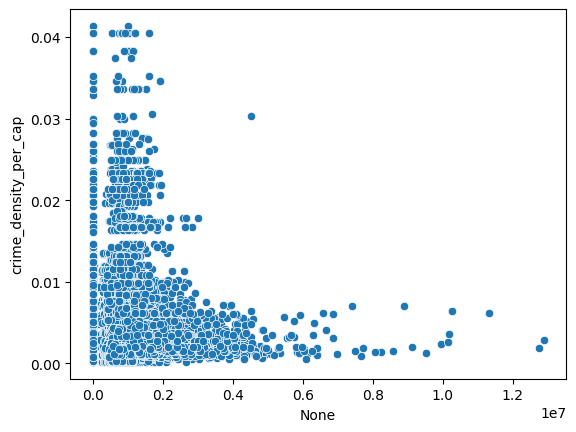

In [57]:
sns.scatterplot(data = house_features,
                x = house_features['Price'] / house_features['Rate'], y = 'crime_density_per_cap')

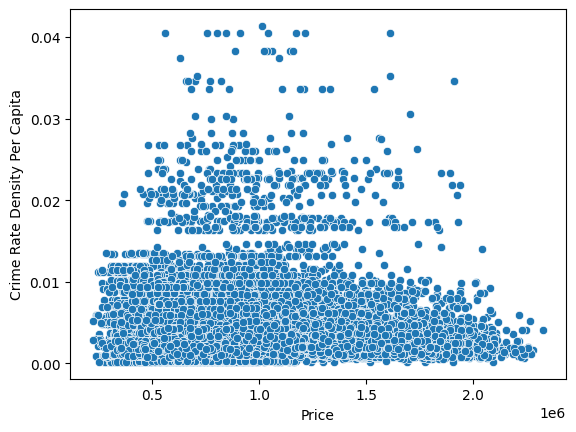

In [58]:
# filter out houses worth more than 3,000,000 and less than 300,000
temp = house_features[(house_features['Price'] > 300000) & (house_features['Price'] < 3000000)]

sns.scatterplot(data = temp, x = temp['Price'] / temp['Rate'], y = 'crime_density_per_cap')

plt.xlabel('Price') #x-axis name
plt.ylabel('Crime Rate Density Per Capita') #y-axis name
plt.show()

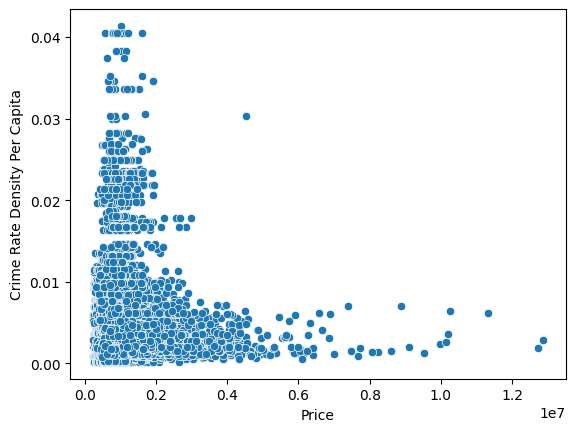

In [59]:
# filter out houses worth less than 300,000
temp = house_features[house_features['Price'] > 300000]

sns.scatterplot(data = temp, x = temp['Price'] / temp['Rate'], y = 'crime_density_per_cap')
plt.xlabel('Price') #x-axis name
plt.ylabel('Crime Rate Density Per Capita') #y-axis name
plt.show()

From those plots above, we can see a distinct group of houses which are much cheaper than the rest.  A bit more digging reveals that there is a group of houses worth less that 50,000 (most worth less than 10,000) and then a large jump to the next lowest houses at 200,000.  These are outliers (maybe rented units) and we can remove them.

In [60]:
# Remove outliers
house_features = house_features[house_features['Price'] >= 50000]

Lets look at the average price of a home in different neighborhoods

In [61]:
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['name', 'geometry']]
plot_geography = plot_geography.set_index('name')

temp = house_features[['name', 'Price', 'Rate']]

temp['Norm'] = temp['Price'] / temp['Rate']

plot_data = temp[['name', 'Norm']]

# Create a base map
map_6 = folium.Map(location=[43.6426, -79.3871], 
                 tiles='cartodbpositron',
                 zoom_start=10)

# Add a choropleth map to the base map
cp = Choropleth(geo_data=plot_geography.__geo_interface__, 
           columns=['name', 'Norm'],
           data=plot_data, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Average Price'
          ).add_to(map_6)

# Display the map
map_6

The rich people in Briddle Path are kind of throwing off the scale, so lets look at the distribution of houses worth less that 3000,0000

In [62]:
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['name', 'geometry']]
plot_geography = plot_geography.set_index('name')

temp = house_features[['name', 'Price', 'Rate']]

temp['Norm'] = temp['Price'] / temp['Rate']

plot_data = temp[temp['Norm'] < 3000000][['name', 'Norm']]

# Create a base map
map_6 = folium.Map(location=[43.6426, -79.3871], 
                 tiles='cartodbpositron',
                 zoom_start=10)

# Add a choropleth map to the base map
cp = Choropleth(geo_data=plot_geography.__geo_interface__, 
           columns=['name', 'Norm'],
           data=plot_data, 
           key_on='feature.id', 
           fill_color='YlOrRd', 
           legend_name='Average Price'
          ).add_to(map_6)

# Display the map
map_6

In [63]:
house_features['Neighb_pop'] = house_features['Count'] # rename Count as Neighb_pop
house_features['neighbourhood'] = house_features['name'] # rename Count as Neighb_pop
house_features['Raw Inflation'] = house_features['INDINF_CPI_Q'] # rename INDINF_CPI_Q as Raw Inflation
house_features['Cuml Inflation'] = house_features['Rate'] # rename Rate as Cuml Inflation
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,index_right,name,area,Count,crime_density,crime_density_per_cap,Neighb_pop,neighbourhood,Raw Inflation,Cuml Inflation
3634,38-bellefontaine-street,2014-01-01,POINT (637480.621 4850945.725),1250000.0,-79.2910,43.7988,True,False,False,3.0,...,139.0,L'Amoreaux,7.154793,43993.0,37.177877,0.000845,43993.0,L'Amoreaux,1.4,1.279079
3638,728-conacher-drive,2014-01-03,POINT (628634.669 4851024.477),1357500.0,-79.4009,43.8011,True,False,False,3.0,...,24.0,Newtonbrook East,4.084669,16097.0,49.698033,0.003087,16097.0,Newtonbrook East,1.4,1.279079
3639,287-strathallan-wood,2014-01-03,POINT (626675.980 4841020.798),1165000.0,-79.4276,43.7114,True,False,False,3.0,...,83.0,Bedford Park-Nortown,5.518287,23236.0,43.491755,0.001872,23236.0,Bedford Park-Nortown,1.4,1.279079
3640,277-highfield-road,2014-01-04,POINT (635011.571 4836928.632),453000.0,-79.3252,43.6731,False,True,False,3.0,...,120.0,Greenwood-Coxwell,1.675166,14417.0,131.927193,0.009151,14417.0,Greenwood-Coxwell,1.4,1.279079
3641,139-kingsview-boulevard,2014-01-04,POINT (615740.600 4839133.647),498000.0,-79.5637,43.6962,True,False,False,3.0,...,137.0,Kingsview Village-The Westway,5.063359,22000.0,37.524499,0.001706,22000.0,Kingsview Village-The Westway,1.4,1.279079


We are going to want to split these houses into oldest and newest to give the effect of 'predicting the future' when we test our model, so lets put them in order from oldest to newest.

In [64]:
house_features = house_features.sort_values('Date')
house_features.head()

,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,...,index_right,name,area,Count,crime_density,crime_density_per_cap,Neighb_pop,neighbourhood,Raw Inflation,Cuml Inflation
3634,38-bellefontaine-street,2014-01-01,POINT (637480.621 4850945.725),1250000.0,-79.2910,43.7988,True,False,False,3.0,...,139.0,L'Amoreaux,7.154793,43993.0,37.177877,0.000845,43993.0,L'Amoreaux,1.4,1.279079
3638,728-conacher-drive,2014-01-03,POINT (628634.669 4851024.477),1357500.0,-79.4009,43.8011,True,False,False,3.0,...,24.0,Newtonbrook East,4.084669,16097.0,49.698033,0.003087,16097.0,Newtonbrook East,1.4,1.279079
3639,287-strathallan-wood,2014-01-03,POINT (626675.980 4841020.798),1165000.0,-79.4276,43.7114,True,False,False,3.0,...,83.0,Bedford Park-Nortown,5.518287,23236.0,43.491755,0.001872,23236.0,Bedford Park-Nortown,1.4,1.279079
3640,277-highfield-road,2014-01-04,POINT (635011.571 4836928.632),453000.0,-79.3252,43.6731,False,True,False,3.0,...,120.0,Greenwood-Coxwell,1.675166,14417.0,131.927193,0.009151,14417.0,Greenwood-Coxwell,1.4,1.279079
3641,139-kingsview-boulevard,2014-01-04,POINT (615740.600 4839133.647),498000.0,-79.5637,43.6962,True,False,False,3.0,...,137.0,Kingsview Village-The Westway,5.063359,22000.0,37.524499,0.001706,22000.0,Kingsview Village-The Westway,1.4,1.279079


We want our final model to not be time influenced, so let's drop the Date, as well as some other columns we no longer need.

In [65]:
house_features = house_features.set_index('address') # set the index as the address
house_features = house_features.drop(columns = ['Date', 'geometry', 'index_right', 'area', 'Count',
                              'INDINF_CPI_Q' ,'Rate', 'name'])
house_features.head()

,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,Utilities,Rooms,Bathrooms,Kitchens,...,Interest %,Delta,Population,Unemployment,crime_density,crime_density_per_cap,Neighb_pop,neighbourhood,Raw Inflation,Cuml Inflation
address,,,,,,,,,,,,,,,,,,,,,
38-bellefontaine-street,1250000.0,-79.2910,43.7988,True,False,False,3.0,10.0,6.5,1.0,...,1.0,0.0,5728000,7.5,37.177877,0.000845,43993.0,L'Amoreaux,1.4,1.279079
728-conacher-drive,1357500.0,-79.4009,43.8011,True,False,False,3.0,12.0,5.0,1.0,...,1.0,0.0,5728000,7.5,49.698033,0.003087,16097.0,Newtonbrook East,1.4,1.279079
287-strathallan-wood,1165000.0,-79.4276,43.7114,True,False,False,3.0,8.5,6.0,1.0,...,1.0,0.0,5728000,7.5,43.491755,0.001872,23236.0,Bedford Park-Nortown,1.4,1.279079
277-highfield-road,453000.0,-79.3252,43.6731,False,True,False,3.0,6.5,2.0,1.0,...,1.0,0.0,5728000,7.5,131.927193,0.009151,14417.0,Greenwood-Coxwell,1.4,1.279079
139-kingsview-boulevard,498000.0,-79.5637,43.6962,True,False,False,3.0,9.0,2.0,1.5,...,1.0,0.0,5728000,7.5,37.524499,0.001706,22000.0,Kingsview Village-The Westway,1.4,1.279079


Now lets add the infrastructure data which was gathered in another notebook, as well as the nearby amenities data.

In [66]:
# add infrastructure data
house_features = pd.merge(house_features, pd.read_csv('Houses_Infrastructure_2km.csv')
                          .set_index('address').iloc[:,22:-1], how= 'left', on = 'address')

# add nearby house amenities data
house_features = pd.merge(house_features, pd.read_csv('Final_house_data_DEC3.csv'), how = 'left', 
                          on = 'address')

FileNotFoundError: [Errno 2] No such file or directory: 'Houses_Infrastructure_2km.csv'

Let's clean up our data one last time

In [65]:
house_features = house_features.fillna(0) # fill blank valuess as not having any ameneties nearby
house_features = house_features.drop_duplicates() # drop any duplicates
house_features = house_features.set_index('address')

print(len(house_features))
house_features.head()

Finally, lets split the data into test and train.  The where the first 80% is in train, and the last 20% is in test

In [70]:
train = house_features.iloc[:34443]
test = house_features.iloc[34443:]
print(len(train)/len(house_features))
print(len(test)/len(house_features))

0.7999953546708785
0.20000464532912157


Last but not least, lets save this data into csvs for modeling and visualizations.

In [71]:
train.to_csv('train.csv')
test.to_csv('test.csv')
house_features.to_csv('this_is_the_completed_csv!.csv')